## 0. Requirements

In [1]:
%pip install pandas scikit-learn seaborn xgboost torch

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 23.3.1 -> 23.3.2
[notice] To update, run: C:\Users\dorum\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip


In [2]:
import pandas as pd
import numpy as np
from scipy.stats import rankdata
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import mean_squared_error
from sklearn.base import is_classifier, is_regressor
from sklearn.preprocessing import StandardScaler
import xgboost as xgb
from sklearn.ensemble import RandomForestRegressor
import torch
import torch.nn as nn
import torch.optim as optim


## 1. Data Loading

In [27]:
df = pd.read_csv('data.csv')
df['date'] = pd.to_datetime(df['date'])
df['sector1'] = df['sector']
df = pd.get_dummies(df, columns=['sector1', 'index_membership'])
df = df.sort_values('date')


def split_date(df, factors=None, factors_excluded=None, target_name='target', date_until=None, date_from=None):
    if date_from:
        df = df[df['date'] >= date_from]
    if date_until:
        df = df[df['date'] <= date_until]    

    # Calculate the split indices
    total_groups = df['date'].nunique()
    train_idx = int(total_groups * 0.6)
    val_idx = train_idx + int(total_groups * 0.2)
    unique_dates = df['date'].unique()
    train_end_date = unique_dates[train_idx]
    val_end_date = unique_dates[val_idx]
    
    # Split the data
    train_data = df[df['date'] <= train_end_date]
    val_data = df[(df['date'] > train_end_date) & (df['date'] <= val_end_date)]
    test_data = df[df['date'] > val_end_date]
    
    if factors:
        X_train = train_data[factors]
        X_val = val_data[factors]
        X_test = test_data[factors]
    elif factors_excluded:
        X_train = train_data.drop(factors_excluded, axis=1)
        X_val = val_data.drop(factors_excluded, axis=1)
        X_test = test_data.drop(factors_excluded, axis=1)
    else:
        X_train = train_data.drop(['date', 'identifier', target_name], axis=1)
        X_val = val_data.drop(['date', 'identifier', target_name], axis=1)
        X_test = test_data.drop(['date', 'identifier', target_name], axis=1)

    Y_train = train_data['target']
    Y_val = val_data['target']
    Y_test = test_data['target']

    return X_train, X_val, X_test, Y_train, Y_val, Y_test


factors = ['factor_1', 'factor_2', 'factor_3', 'factor_4', 'factor_5', 'factor_6', 'factor_7', 'factor_8', 'factor_9', 'factor_10']
marketcap_cols = ['market_cap']
target = 'target'

X_train, X_val, X_test, Y_train, Y_val, Y_test = split_date(df, factors=factors, target_name=target)

### 1.1. Add New Target

In [4]:
'''
"carved out" return by sector
see a company performs better than **median** return of the company in this sector
'''

# Calculate the average return for each sector on each day
sector_date_avg_return = df.groupby(['date', 'sector'])['target'].median().reset_index()
sector_date_avg_return.rename(columns={'target': 'sector_med_return'}, inplace=True)

# Map the average sector return to the original dataset
df = df.merge(sector_date_avg_return, on=['date', 'sector'])

# Construct a new return target
df['target_carve_out'] = df['target'] - df['sector_med_return']


## 2. Data Cleaning & Analysis

#### 2.1. Overall Check

In [5]:
# Descriptive statistics
descriptive_stats = df.describe()
descriptive_stats[factors + [target] + marketcap_cols]

,factor_1,factor_2,factor_3,factor_4,factor_5,factor_6,factor_7,factor_8,factor_9,factor_10,target,market_cap
count,32202.000000,3.220200e+04,32202.000000,32202.000000,32202.000000,32202.000000,3.220200e+04,32202.000000,3.220200e+04,32202.000000,3.220200e+04,3.220200e+04
mean,0.498756,-1.462113e-04,0.500189,0.498953,0.500697,0.499683,4.981013e-01,0.498162,-1.756859e-04,0.498593,-1.844661e-04,1.095296e+10
std,0.288787,5.759326e-03,0.289240,0.288920,0.288964,0.288080,2.875331e-01,0.289374,6.064242e-03,0.287299,5.914170e-03,1.572001e+10
min,0.000066,-1.545644e-01,0.000063,0.000076,0.000056,0.000050,3.547287e-07,0.000034,-1.945520e-01,0.000023,-1.669913e-01,-4.825453e+08
25%,0.249074,-3.602127e-04,0.246556,0.251858,0.250038,0.251288,2.507394e-01,0.248211,-3.680745e-04,0.251549,-3.533136e-04,2.505520e+09
50%,0.496954,8.698222e-07,0.502099,0.496547,0.501924,0.496901,4.953077e-01,0.495810,9.016693e-07,0.495600,8.821662e-07,4.884047e+09
75%,0.748845,3.912393e-04,0.752583,0.749778,0.750799,0.748982,7.454329e-01,0.748112,3.857279e-04,0.748538,3.900145e-04,1.151506e+10
max,0.999972,8.053847e-02,0.999993,0.999992,0.999937,0.999943,9.999425e-01,0.999990,1.045811e-01,0.999971,8.577309e-02,1.534334e+11


### 2.2. Overall Check by Date

In [6]:
# Check for missing values (in each group)

# Group by date
grouped_df = df.groupby('date')

group_stats = grouped_df.describe()

group_missing_values = grouped_df.apply(lambda x: x.isnull().sum())
for i, subdf in group_missing_values.items():
    print(i, sum(subdf))

date 0
identifier 0
market_cap 0
sector 0
factor_1 0
factor_2 0
factor_3 0
factor_4 0
factor_5 0
factor_6 0
factor_7 0
factor_8 0
factor_9 0
factor_10 0
target 0
sector1_10 0
sector1_15 0
sector1_20 0
sector1_25 0
sector1_30 0
sector1_35 0
sector1_40 0
sector1_45 0
sector1_50 0
sector1_55 0
index_membership_True 0
sector_med_return 0
target_carve_out 0


**Conclusion**:
   - No missing data, only marketcap with some negative values
   - Most factors are normalized, ranging from 0 to 1. Some are not (further discussion later)
   - All entries are within the universe, the membership column can be neglected

### 2.3. MarketCap

#### 2.3.1. Negative Values

In [7]:
df.loc[df['market_cap'] < 0, 'market_cap'] = None
df['market_cap'].fillna(method='ffill', inplace=True)

#### 2.3.2. Normalization

In [33]:
# Loop through each date to calculate the average and standard deviation of market cap up to that date, and then standardize it
standardized_market_caps = []
for date in df['date'].unique():
    historical_data = df[df['date'] <= date]

    # Calculate the mean and standard deviation of market cap
    scaler = StandardScaler()
    market_caps = historical_data['market_cap'].values.reshape(-1, 1)
    scaler.fit(market_caps)

    # Standardize the market cap for the current date
    current_date_data = df[df['date'] == date]
    current_market_caps = current_date_data['market_cap'].values.reshape(-1, 1)
    standardized_caps = scaler.transform(current_market_caps)

    standardized_market_caps.extend(standardized_caps.flatten())

# Add the standardized market cap to the original DataFrame
df['standardized_market_cap'] = standardized_market_caps


### 2.4. Universe Changes

In [9]:
# firms
firms = set()
for date, subdf in grouped_df:
    firms_t = set(subdf['identifier'].tolist())
    if not firms: firms = firms_t
    added, deleted = firms_t.difference(firms), firms.difference(firms_t)
    firms = firms_t
    if added or deleted:
        print(f'{date} -- added: {added} -- deleted: {deleted}')


2010-02-10 00:00:00 -- added: {'KRHA12XYXRA2', 'FJX11WUWFDJ0'} -- deleted: {'LYCPQJ19AOY0', 'KHKNKSMXBWP3', 'PNUM57CYEB27', 'GBHCPWVM8HK1', 'EHXDX2RIBQC0'}
2010-04-14 00:00:00 -- added: set() -- deleted: {'DKHPXAJKWEJ4'}
2010-05-12 00:00:00 -- added: {'AIMGPNPAIU76', 'GMGNUCLXD8X6', 'DEFOYAB33404', 'AMQVTJPVOI23'} -- deleted: {'GHZVYJEVFWV2', 'MFJ79IECZ4E4', 'MA4C5MV6E9N4', 'BO08CRIHCGH9', 'MCPB9DMIIOA9'}
2010-06-16 00:00:00 -- added: {'TN3ECRZ84GP6'} -- deleted: set()
2010-07-07 00:00:00 -- added: {'GFM2UIUHJTY3'} -- deleted: set()
2010-08-11 00:00:00 -- added: {'FMOHK7CPCLT3', 'MSJ4AKSW4R33'} -- deleted: {'TN3ECRZ84GP6', 'VE20QGX6HOV2', 'BLGDFABYR9Q2', 'CXUIYIJ4RVU7', 'SIUZ1AXVA5P1', 'BHNZGNYW7DK3', 'LVE5FL9B1399'}
2010-10-27 00:00:00 -- added: {'TZQAFZ0FXW66'} -- deleted: set()
2010-11-10 00:00:00 -- added: {'DKUHGHQ1UFY1', 'SJJINSH5JOR0', 'NU6O1IWC63J1', 'IOHJTIHSAXK0', 'TRQ8D70G13R7', 'SV74Q1S88VG7'} -- deleted: {'GL7T1NEHEUL1', 'CD50O22IM7H9', 'ZMYXRS4KVOG2', 'MTIYG11FSGE3', 'INY

**Conclusion**: The universe changes less frequently (monthly), what we can do is to keep those old stocks in the universe at their same indexes. One fact I found while checking the data is, they are already stably sorted as I mentioned, so I will implement a function to double assure this static ordering. 

In [ ]:
def reorder_items(df):
    # Dictionary to keep track of the last known position of each item
    last_known_positions = {}
    # List to collect the new order
    new_order_df_list = []

    df_sorted_by_date = df.sort_values('date')

    for date in df_sorted_by_date['date'].unique():
        current_day_df = df_sorted_by_date[df_sorted_by_date['date'] == date]

        # Sort current day items by their last known position, or by a new position if not known
        current_day_df['position'] = current_day_df['identifier'].apply(
            lambda x: last_known_positions.setdefault(x, len(last_known_positions))
        )
        sorted_current_day_df = current_day_df.sort_values('position')

        # Update the positions for the next iteration
        for pos, item in enumerate(sorted_current_day_df['identifier']):
            last_known_positions[item] = pos

        new_order_df_list.append(sorted_current_day_df.drop('position', axis=1))

    new_order_df = pd.concat(new_order_df_list, ignore_index=True)
    return new_order_df


## 3. Feature Selections

In [10]:
selected_columns = df[factors + [target] + marketcap_cols]
selected_columns.corr()

,factor_1,factor_2,factor_3,factor_4,factor_5,factor_6,factor_7,factor_8,factor_9,factor_10,target,market_cap
factor_1,1.000000,0.001889,-0.003227,-0.003219,-0.000620,0.005834,-0.009161,-0.000748,0.001229,0.004804,0.002619,-0.007439
factor_2,0.001889,1.000000,-0.006164,-0.008551,-0.001089,0.003734,-0.005302,-0.001392,0.737653,0.009160,0.741190,-0.003959
factor_3,-0.003227,-0.006164,1.000000,0.003197,0.011552,0.004475,0.001043,-0.001167,-0.008344,-0.002305,-0.006199,-0.002633
factor_4,-0.003219,-0.008551,0.003197,1.000000,-0.005717,-0.002598,-0.004391,-0.001761,-0.004422,-0.003541,-0.007632,-0.007611
factor_5,-0.000620,-0.001089,0.011552,-0.005717,1.000000,0.009995,-0.004368,-0.000732,-0.001979,0.001941,0.004067,0.000497
factor_6,0.005834,0.003734,0.004475,-0.002598,0.009995,1.000000,0.004170,-0.001509,0.004166,-0.004353,0.005232,0.005712
factor_7,-0.009161,-0.005302,0.001043,-0.004391,-0.004368,0.004170,1.000000,-0.003671,-0.002071,0.006254,-0.009131,-0.001258
factor_8,-0.000748,-0.001392,-0.001167,-0.001761,-0.000732,-0.001509,-0.003671,1.000000,-0.001089,-0.005481,-0.005560,-0.002986
factor_9,0.001229,0.737653,-0.008344,-0.004422,-0.001979,0.004166,-0.002071,-0.001089,1.000000,0.007311,0.777278,-0.001054
factor_10,0.004804,0.009160,-0.002305,-0.003541,0.001941,-0.004353,0.006254,-0.005481,0.007311,1.000000,0.004316,-0.002839


From correlation analysis:
 - factor_2 and factor_9 shows quite strong correlations with target, it is way too strong than usual so we could make further checks
 - marketcap shows relatively week correlation with target
 - as for other factors, factor_6 shows slightly higher correlation than marketcap

Let's draw pairplot to have a deeper understanding of these factors 

In [11]:
pearson_corr = df[['factor_2', 'factor_9', 'target']].corr(method='pearson')
spearman_corr = df[['factor_2', 'factor_9', 'target']].corr(method='spearman')

print(f'Pearson: \n{pearson_corr}\n\nSpearman: \n{spearman_corr}')

Pearson: 
          factor_2  factor_9    target
factor_2  1.000000  0.737653  0.741190
factor_9  0.737653  1.000000  0.777278
target    0.741190  0.777278  1.000000

Spearman: 
          factor_2  factor_9    target
factor_2  1.000000  0.958448  0.957699
factor_9  0.958448  1.000000  0.957946
target    0.957699  0.957946  1.000000


In [31]:
# Rank transformation for factor_2 and factor_9
df['rank_factor_2'] = rankdata(df['factor_2'], method='average')
df['rank_factor_9'] = rankdata(df['factor_9'], method='average')

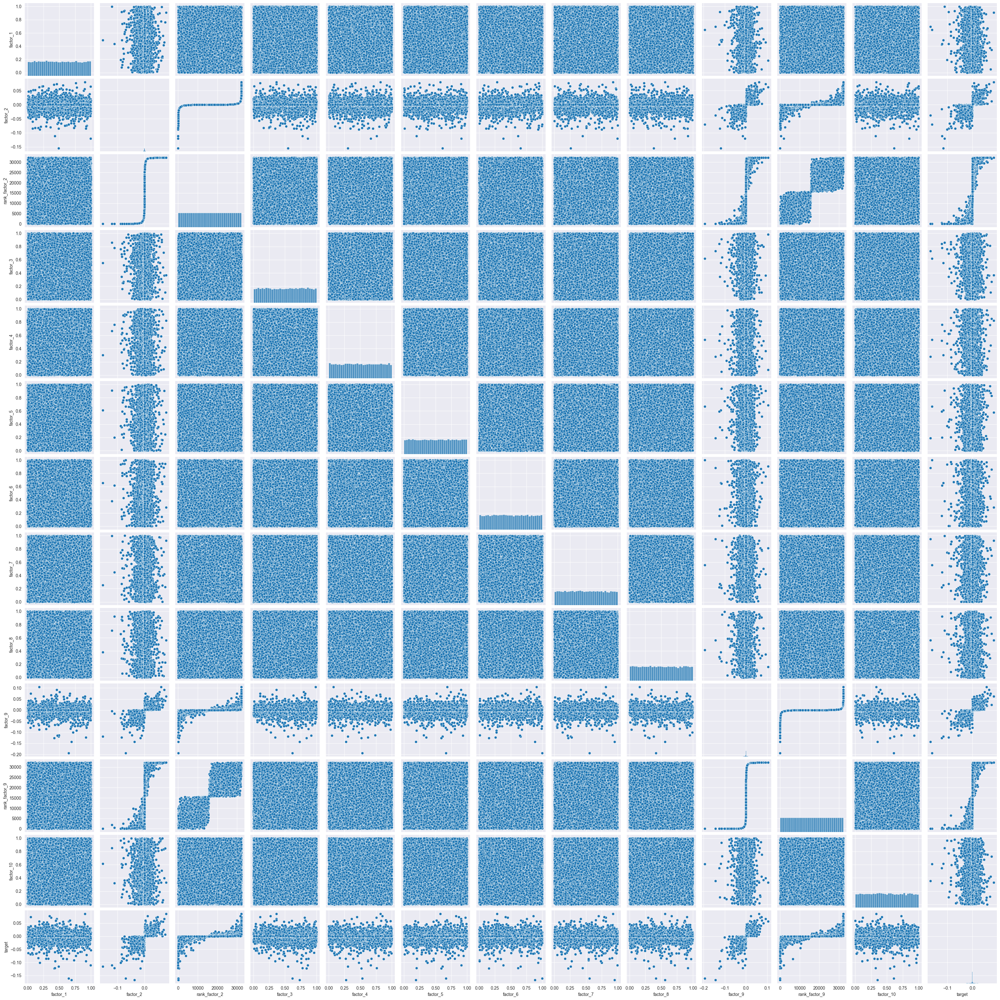

In [13]:
# Pairplot for factors and target
sns.pairplot(df[['factor_1', 'factor_2', 'rank_factor_2', 'factor_3', 'factor_4', 'factor_5', 'factor_6', 'factor_7', 'factor_8', 'factor_9', 'rank_factor_9', 'factor_10', 'target']])
plt.show()

Conclusions: 
 - factor 1, 3, 4, 5, 6, 7, 8, 10 range from 0 to 1, no significant collinear dependency found
 - factor 2, 9 and target strongly relevant, and
   -- after ranking, their correlations are even stronger. Thus we also generate their ranking values.
   -- these two factors show week correlations with each other. This allows us to introduce both factors to the model.
     

In the end, we choose **(ranking)_factor_2, (ranking)_factor_9, factor_6, market_cap** as factors, to predict **carve_out_returns**.    


## 4. Models

I selected three models to address the task at hand: XGBoost, Random Forest, and a feed-forward neural network.

Tree models are particularly advantageous for their ability to quantify feature importance. They are renowned for their robust forecasting abilities and their resistance to overfitting, which are key reasons behind my preference for these models in developing a solution.

XGBoost and Random Forest are grounded in distinct methodologies—boosting and bagging, respectively. Observing their performance differences in practical applications will be insightful. Regarding the neural network approach, while employing alternative architectures like GRU (Gated Recurrent Unit) and TCN (Temporal Convolutional Network) could be beneficial, as they also exhibit a strong resistance to overfitting, my intention is to use a straightforward neural network as a baseline for comparing against the tree-based models.

In [34]:
target_name = 'target'
fs = ['rank_factor_2', 'rank_factor_9', 'factor_9', 'factor_2', 'factor_6', 'standardized_market_cap']
X_train, X_val, X_test, Y_train, Y_val, Y_test = split_date(df, factors=fs, target_name=target_name)
print(df.columns, len(X_train), len(X_val), len(X_test))

Index(['date', 'identifier', 'market_cap', 'sector', 'factor_1', 'factor_2',
       'factor_3', 'factor_4', 'factor_5', 'factor_6', 'factor_7', 'factor_8',
       'factor_9', 'factor_10', 'target', 'sector1_10', 'sector1_15',
       'sector1_20', 'sector1_25', 'sector1_30', 'sector1_35', 'sector1_40',
       'sector1_45', 'sector1_50', 'sector1_55', 'index_membership_True',
       'rank_factor_2', 'rank_factor_9', 'standardized_market_cap'],
      dtype='object') 19696 6128 6378


### 4.1. XGBoost

In [16]:
dtrain = xgb.DMatrix(X_train, label=Y_train)
dval = xgb.DMatrix(X_val, label=Y_val)
dtest = xgb.DMatrix(X_test, label=Y_test)

params = {
    'max_depth': 6,
    'eta': 0.3,
    'eval_metric': 'rmse'
}

# Training the model
model_xgb = xgb.train(params, dtrain, evals=[(dval, 'eval')], early_stopping_rounds=10)

# Evaluating on the test set
test_rmse = model_xgb.eval(dtest)
test_rmse

[0]	eval-rmse:0.00605
[1]	eval-rmse:0.00546
[2]	eval-rmse:0.00508
[3]	eval-rmse:0.00489
[4]	eval-rmse:0.00478
[5]	eval-rmse:0.00472
[6]	eval-rmse:0.00469
[7]	eval-rmse:0.00468
[8]	eval-rmse:0.00470
[9]	eval-rmse:0.00470


'[0]\teval-rmse:0.00491471258390602'

In [17]:
def draw_feature_importances(feature_importances):
    # Sort the feature importances
    sorted_importance = sorted(feature_importances.items(), key=lambda x: x[1], reverse=True)
    print(sorted_importance)

    # Plot feature importances
    plt.bar(range(len(sorted_importance)), [val[1] for val in sorted_importance], align='center')
    plt.xticks(range(len(sorted_importance)), [val[0] for val in sorted_importance])
    plt.xticks(rotation=90)
    plt.xlabel('Features')
    plt.ylabel('Importance')
    plt.title('Feature Importances')
    plt.show()


[('rank_factor_9', 0.0027769228909164667), ('rank_factor_2', 0.0023314410354942083), ('factor_6', 0.0004991301684640348), ('standardized_market_cap', 0.00031682723783887923)]


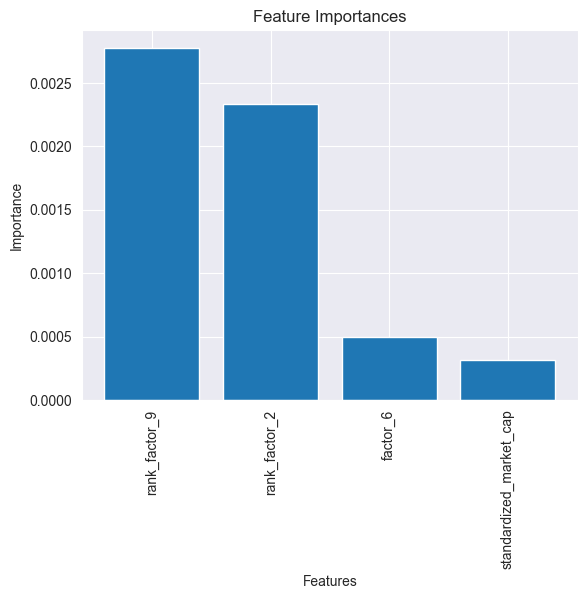

In [18]:
feature_importances = model_xgb.get_score(importance_type='gain')
draw_feature_importances(feature_importances)

### 4.2. Random Forest

In [19]:
# Initialize and train the Random Forest model
model_rf = RandomForestRegressor(n_estimators=100)
# train
model_rf.fit(X_train, Y_train)

# val
y_val_pred = model_rf.predict(X_val)
val_rmse = mean_squared_error(Y_val, y_val_pred, squared=False)
print("Validation RMSE:", val_rmse)

# test
y_test_pred = model_rf.predict(X_test)
test_rmse = mean_squared_error(Y_test, y_test_pred, squared=False)
print("Test RMSE:", test_rmse)

#carve as f 0.00069

Validation RMSE: 0.004116489669646304
Test RMSE: 0.0043479564054408615


[('rank_factor_9', 0.29851325538036677), ('factor_9', 0.24109662533857396), ('rank_factor_2', 0.16769370171467746), ('factor_2', 0.16340725519279356), ('factor_6', 0.06829852785924684), ('standardized_market_cap', 0.06099063451434148)]


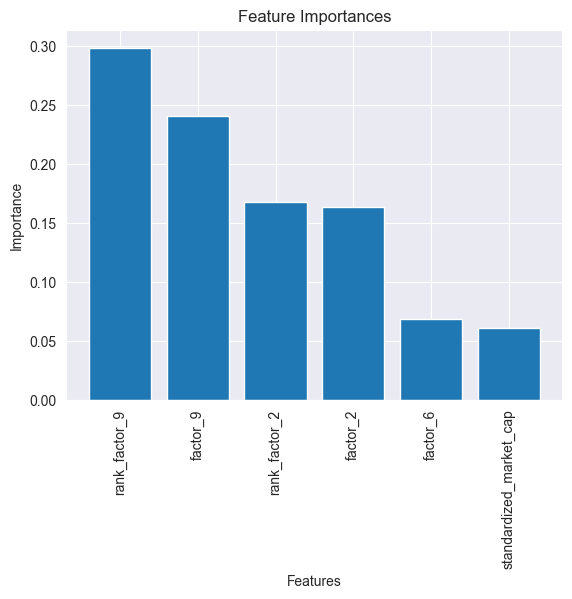

In [20]:
# Feature importance detection
feature_importances = model_rf.feature_importances_
feature_importances = {k: v for k, v in zip(fs, feature_importances)}
draw_feature_importances(feature_importances)

### 4.3. Feed Forward Neural Network

In [21]:
class Net(nn.Module):
    def __init__(self):
        super(Net, self).__init__()
        self.fc1 = nn.Linear(X_train.shape[1], 128)
        self.fc2 = nn.Linear(128, 64)
        self.fc3 = nn.Linear(64, 1)

    def forward(self, x):
        x = torch.relu(self.fc1(x))
        x = torch.relu(self.fc2(x))
        x = self.fc3(x)
        return x

X_train_tensor = torch.tensor(X_train.values, dtype=torch.float32)
Y_train_tensor = torch.tensor(Y_train.values, dtype=torch.float32)
X_val_tensor = torch.tensor(X_val.values, dtype=torch.float32)
Y_val_tensor = torch.tensor(Y_val.values, dtype=torch.float32)
X_test_tensor = torch.tensor(X_test.values, dtype=torch.float32)
Y_test_tensor = torch.tensor(Y_test.values, dtype=torch.float32)

# Initialize the model, loss function, and optimizer
model_nn = Net()
criterion = nn.MSELoss()
optimizer = optim.Adam(model_nn.parameters(), lr=0.001)

# Training loop
for epoch in range(1000):
    optimizer.zero_grad()
    outputs = model_nn(X_train_tensor)
    loss = criterion(outputs.squeeze(), Y_train_tensor)
    loss.backward()
    optimizer.step()
    
    # Validation step
    with torch.no_grad():
        val_outputs = model_nn(X_val_tensor).squeeze()
        val_loss = criterion(val_outputs, Y_val_tensor)
        print(f'Epoch {epoch+1}, Training Loss: {loss.item()}, Validation Loss: {val_loss.item()}')

# Predictions and RMSE calculation on test data
with torch.no_grad():
    nn_predictions = model_nn(X_test_tensor).squeeze()
    nn_rmse = torch.sqrt(torch.mean((Y_test_tensor - nn_predictions) ** 2))

print("Test RMSE:", nn_rmse.item())



C:\Users\dorum\AppData\Local\Temp\ipykernel_7852\1984324269.py:15: UserWarning: Failed to initialize NumPy: module compiled against API version 0x10 but this version of numpy is 0xf . Check the section C-API incompatibility at the Troubleshooting ImportError section at https://numpy.org/devdocs/user/troubleshooting-importerror.html#c-api-incompatibility for indications on how to solve this problem . (Triggered internally at ..\torch\csrc\utils\tensor_numpy.cpp:84.)
  X_train_tensor = torch.tensor(X_train.values, dtype=torch.float32)


Epoch 1, Training Loss: 1038108.6875, Validation Loss: 18742.828125
Epoch 2, Training Loss: 27714.70703125, Validation Loss: 118233.6953125
Epoch 3, Training Loss: 180839.203125, Validation Loss: 258379.84375
Epoch 4, Training Loss: 395324.84375, Validation Loss: 216464.359375
Epoch 5, Training Loss: 331215.0625, Validation Loss: 96513.078125
Epoch 6, Training Loss: 147467.515625, Validation Loss: 11922.2451171875
Epoch 7, Training Loss: 18044.615234375, Validation Loss: 8438.341796875
Epoch 8, Training Loss: 12992.6611328125, Validation Loss: 58838.92578125
Epoch 9, Training Loss: 90476.921875, Validation Loss: 102914.3203125
Epoch 10, Training Loss: 158108.015625, Validation Loss: 104340.2578125
Epoch 11, Training Loss: 160282.65625, Validation Loss: 68803.6953125
Epoch 12, Training Loss: 105740.7578125, Validation Loss: 25454.2265625
Epoch 13, Training Loss: 39169.45703125, Validation Loss: 1519.3013916015625
Epoch 14, Training Loss: 2328.933349609375, Validation Loss: 6306.90087890

## 5. Evaluation

Firstly, the dataset comprises weekly data spanning two years. This duration may not be sufficient for a thorough evaluation of the strategy, especially since the data is divided into training, validation, and testing sets, leaving a limited amount of data for prediction. To address this, I have chosen to employ an expanding/rolling window approach in the training process. This method aims to maximize the generation of predictions while avoiding any foresight into future data.

All models are assessed using RMSE (Root Mean Square Error), a standard metric in financial analysis. However, it's important to note that in real-world investment, there isn't a direct correlation between machine learning evaluation metrics and actual strategy performance. A lower RMSE doesn't necessarily translate to a successful investment strategy.

Additional considerations in real transactions, such as pricing, transaction fees, etc., also play a crucial role. For instance, while aiming for a high information ratio with low turnover, one might consider adding a penalty to the loss function to discourage frequent changes in selected stocks at each data point. However, our dataset focuses solely on returns, omitting these real-world factors. Consequently, I have decided to develop a strategy that overlooks these aspects.

In summary, I will establish a machine learning framework, incorporating grid search and expanding window training, to derive optimal predictions from these models. Following this, a straightforward backtesting framework will be used to test the signals generated by these models, selecting top 20% stocks in sector return and focusing exclusively on returns to evaluate their performance.

In [22]:
def backtest(df, signal_col='target'):    
    # group by date and sector, then take top 20%
    top_20_pct_stocks = df.groupby(['date', 'sector'], group_keys=False) \
        .apply(lambda x: x.nlargest(int(len(x) * 0.2), signal_col))
    
    # calculate returns by date
    top_20_pct_stocks['cumulative_return'] = top_20_pct_stocks.groupby('date')['target'].transform('sum').cumsum()
    
    # cumulative return diagram
    plt.figure(figsize=(12, 6))
    for sector in top_20_pct_stocks['sector'].unique():
        sector_data = top_20_pct_stocks[top_20_pct_stocks['sector'] == sector]
        plt.plot(sector_data['date'], sector_data['cumulative_return'], label=sector)
    
    plt.title('Cumulative Return by Sector Over Time')
    plt.xlabel('Date')
    plt.ylabel('Cumulative Return')
    plt.legend()
    plt.grid(True)
    plt.show()

In [69]:
def grid_search(model_fn, params_grid, X_train, Y_train, X_val, Y_val):
    best_rmse = float("inf")
    best_params = None

    for params in params_grid:
        model = model_fn(**params)
        if hasattr(model, 'fit'):
            if is_classifier(model) or is_regressor(model):
                # sklearn
                model.fit(X_train, Y_train)
            else:
                # XGBoost
                model.fit(X_train, Y_train, eval_set=[(X_val, Y_val)], early_stopping_rounds=10, verbose=False)
        else:
            raise Exception("The model must have a 'fit' method.")

        # RMSE
        val_pred = model.predict(X_val)
        val_rmse = mean_squared_error(Y_val, val_pred, squared=False)

        if val_rmse < best_rmse:
            best_rmse = val_rmse
            best_params = params

    return best_params


def expanding_window_training(df, model_fn, params_grid, split_date_fn, target_name='target', prediction_name='prediction', window_size=0, factors=None):
    # init signal column
    best_predictions = df.copy()
    best_predictions = best_predictions.reset_index(drop=True)
    best_predictions[prediction_name] = np.nan
    best_val_rmse = float('inf')

    unique_dates = sorted(df['date'].unique())

    for current_date in unique_dates:
        beg_date = unique_dates[0 if not window_size else max(0, (unique_dates.index(current_date) - window_size))]
        # split_date_fn in selected window
        X_train, X_val, X_test, Y_train, Y_val, Y_test = split_date_fn(df, factors=factors, target_name=target_name, date_until=current_date, date_from=beg_date)

        # all data not empty
        if X_train.empty or X_val.empty or X_test.empty:
            continue

        # grid search
        best_params = grid_search(model_fn, params_grid, X_train, Y_train, X_val, Y_val)

        # train with bast params
        model = model_fn(**best_params)
        model.fit(X_train, Y_train)

        # RMSE on val dataset
        val_pred = model.predict(X_val)
        val_rmse = mean_squared_error(Y_val, val_pred, squared=False)

        if val_rmse < best_val_rmse:
            best_val_rmse = val_rmse

            # predict on test dataset
            test_pred = model.predict(X_test)

            start_index = len(df[df['date'] <= current_date]) - len(Y_test)
            end_index = start_index + len(test_pred) - 1
            
            # update predictions/signals
            best_predictions.loc[start_index: end_index, prediction_name] = test_pred


    # 0 to fill na
    best_predictions[prediction_name].fillna(0, inplace=True)

    return best_predictions


In [70]:
fs = ['rank_factor_2', 'rank_factor_9', 'factor_9', 'factor_2', 'factor_6', 'standardized_market_cap']
window_size=int((12*4)/0.6+1)
target_name='target_carve_out'
prediction_name='prediction'
# df.columns

### 5.1. XGBoost

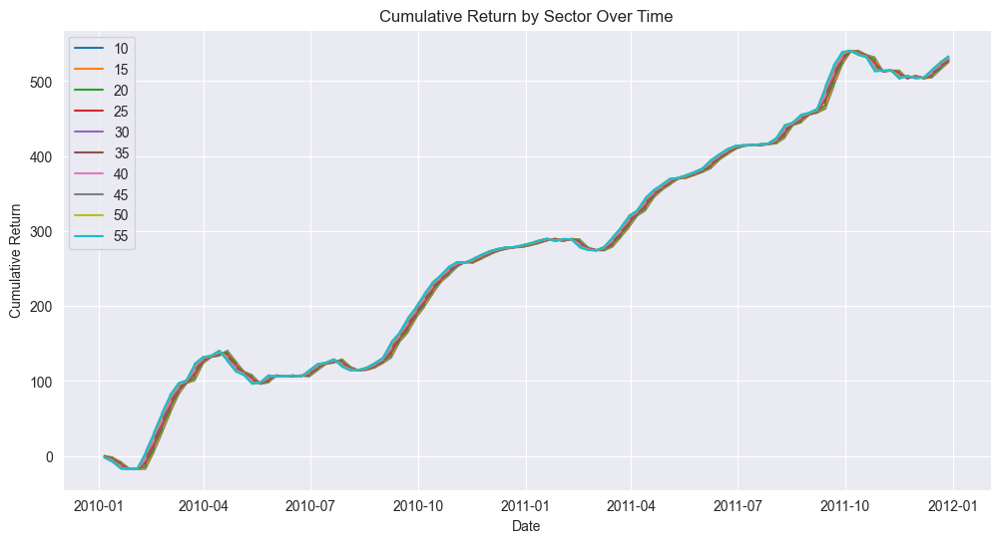

In [71]:
xgb_params_grid = [
    {'max_depth': 4, 'eta': 0.1},
    {'max_depth': 6, 'eta': 0.2},
    {'max_depth': 6, 'eta': 0.3}
]

xgb_predictions = expanding_window_training(
    df,
    xgb.XGBRegressor,
    xgb_params_grid,
    split_date,
    factors=fs,
    window_size=window_size,
    target_name=target_name,
    prediction_name=prediction_name
)

backtest(xgb_predictions, signal_col=prediction_name)

### 5.2. Random Forest

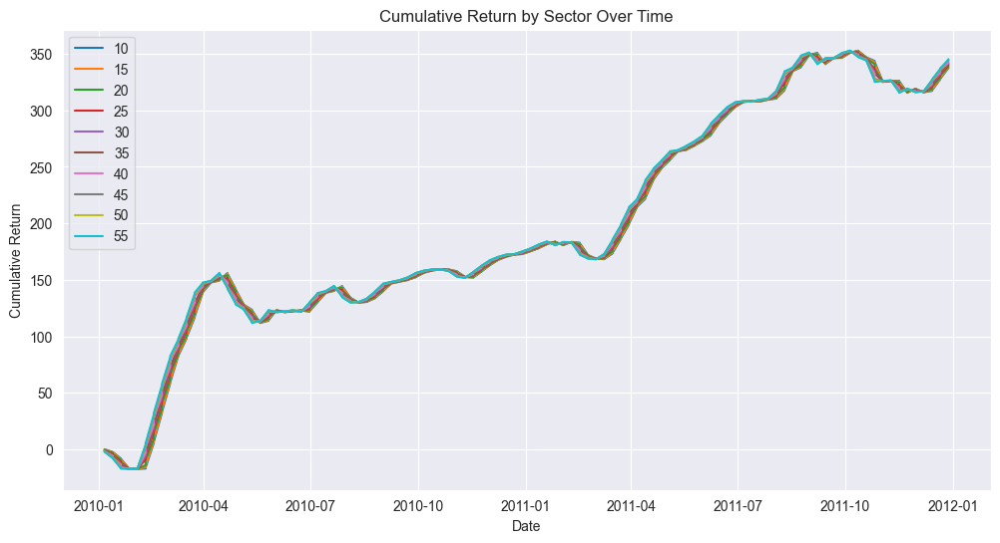

In [72]:
rf_params_grid = [
    {'n_estimators': 100, 'max_depth': 4},
    {'n_estimators': 200, 'max_depth': 6}
]

rf_predictions = expanding_window_training(
    df,
    RandomForestRegressor,
    rf_params_grid,
    split_date,
    factors=fs,
    window_size=window_size,
    target_name=target_name,
    prediction_name=prediction_name
)

backtest(rf_predictions, signal_col=prediction_name)

## 6. Summary

### Data Preprocessing

#### Factors Considered

- Selected `factor_2, factor_9` due to their strong correlations with the target, without colinearity concerns. Remarkably, these factors show significantly stronger correlations, to the extent that the return (positive/negative) could be predicted solely based on them (Note: This is highly unlikely in real markets).
- In addition to these two factors, I included normalized market capitalization (marketcap) in the model. Although it's not highly effective, it's a meaningful factor for return forecasting. Another approach is to calculate weighted returns based on marketcap, but I chose not to pursue this, as its performance heavily depends on subsequent strategies, preferring a more generalized approach.
- Incorporated `factor_6` as it is the only remaining factor showing a stronger correlation with the target, especially after including marketcap.
- Sector information improved model performance, but since I aim to forecast returns by sector, I want to handle this aspect through strategy rather than the model, leading to its exclusion.
- Decided against using dimensionality reduction methods like PCA to maintain the original labels of factors, which is beneficial for later feature importance analysis.

#### Target

- Opted to forecast sector-carved returns instead of raw returns, a common practice in investment for better performance. This approach also allows assigning different investment weights to various sectors, aiding in model generalization.

---

### Models

Chose three models for this task:

1. **XGBoost and Random Forest**: Both are tree-based models. Preferred for their ability to highlight feature importances and their robustness in forecasting tasks with minimal risk of overfitting. Chose these two to compare different tree model approaches (boosting vs. bagging).
   
2. **Feed-Forward Neural Network**: Selected primarily to provide a baseline for the tree models. While neural networks can be powerful and achieve superior performance (as evidenced in one of my similar equity selection projects), this project's focus isn't solely on performance. Thus, implemented a basic neural network solution.

**Results**: The Random Forest (RF) model exhibited a better RMSE score than XGBoost, and both outperformed the neural network in this metric.

---

### Evaluation  

- While machine learning performance metrics (like RMSE) are useful, they don't always correlate directly with strategy performance. Therefore, a simple backtest strategy was implemented, selecting the top 20% of stocks within each sector for investment.
- The resulting diagram showed promising cumulative returns, attributed partly to the effective models and the strong factors used. The backtest confirms the model's capability to generate reliable signals for the equity market.

---

### Answers to Questions

- **Model Choice: Random Forest and XGBoost**:
  - Strengths: Ideal for low-dimensional data as in this case. Both models are proven effective for forecasting tasks and are resistant to overfitting. RF excels in robustness, while XGBoost offers superior performance.
  - Weaknesses: Lower explainability and high computational resource requirements.
- **Important Features**: Primarily `factor 2` and `factor 9`, with relative lesser importance of `factor 6` and marketcap.
- **Performance Evaluation**: Utilized RMSE for machine learning assessment and a backtest strategy for practical application.
- **Ensuring Generalization**: Conducted data missing/validation checks. Selected features based on statistical correlation analysis, independent of their inherent meanings. Chose models that are agnostic to the meaning of input data, emphasizing robustness. The backtest strategy, focused on returns, is simple yet expandable.